In [1]:
# pip install networkx

In [2]:
# pip install osmnx

In [3]:
# pip install scikit-learn

In [4]:
# pip install folium

In [5]:
# pip install mapclassify

In [6]:
import networkx as nx

In [7]:
import osmnx as ox

In [8]:
import sklearn

In [9]:
import matplotlib

In [10]:
import folium

In [144]:
import numpy as np

In [11]:
import mapclassify

In [12]:
import pandas as pd

## Use networkx and osmnx to view nodes and edges of an area

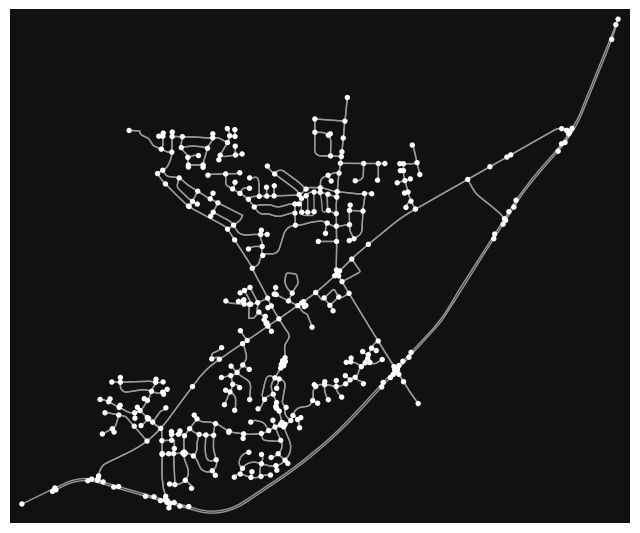

(<Figure size 800x800 with 1 Axes>, <AxesSubplot: >)

In [130]:
# download and model the street network for an area:
G = ox.graph_from_place("Rolesville, NC, USA", network_type="drive") # G is an input graph

# visualize it
ox.plot_graph(G)

Coordinates of starting and ending: (35.9264448,-78.4624239) ==> (35.9181458,-78.4686471)

In [131]:
# get the nearest network node to the origin point and destination point (x (longitude) & y (latitude) coordinates)
orig_node = ox.nearest_nodes(G, X= -78.4624239, Y = 35.9264448)
dest_node = ox.nearest_nodes(G, X= -78.4686471, Y = 35.9181458)

In [132]:
print(orig_node)
print(dest_node)

1308230394
1308259953


In [133]:
# Solve shortest path from origin node(s) to destination node(s).
route = nx.shortest_path(G, orig_node, dest_node, 
                         weight='length') # find the shortest path by minimizing distance traveled 

In [134]:
route

[1308230394,
 7404054525,
 1308230485,
 6625198617,
 3312728292,
 195447569,
 3312728282,
 1308259958,
 1308259953]

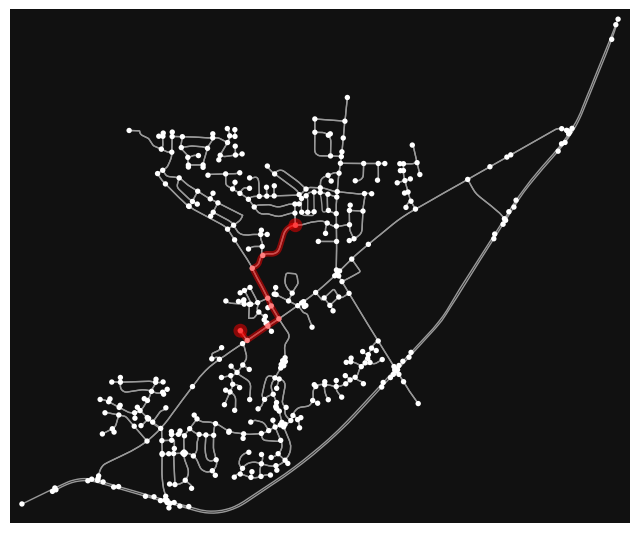

(<Figure size 800x800 with 1 Axes>, <AxesSubplot: >)

In [135]:
ox.plot_graph_route(G, route) #, route_linewidth=6, node_size=0, bgcolor='k')

## Use osmnx.folium module to view nodes and edges of an area

In [136]:
ox.plot_graph_folium(G)

In [137]:
nodes.head(5)

,y,x,street_count,highway,geometry
osmid,,,,,
195423398,35.934436,-78.454109,3,NaN,POINT (-78.45411 35.93444)
195423410,35.932684,-78.455163,1,turning_circle,POINT (-78.45516 35.93268)
195429877,35.928673,-78.436330,4,NaN,POINT (-78.43633 35.92867)
195429896,35.932820,-78.441078,3,NaN,POINT (-78.44108 35.93282)
195433212,35.924740,-78.455603,3,NaN,POINT (-78.45560 35.92474)


## Use GeoDataFrame to color osmnx edges by areas

In [90]:
place = ["Rolesville, NC", "Garner, NC", "Apex, NC"]
gdf_nodes = gdf_edges = None
for place in place:
    # Create graph from OSM within the boundaries of some geocodable place(s).
    G2 = ox.graph_from_place(place, retain_all=True, network_type='drive')
    # Convert node and edge GeoDataFrames to a MultiDiGraph.
    nodes2, edges2 = ox.graph_to_gdfs(G2)
    nodes2["place"] = place
    edges2["place"] = place
    if gdf_nodes is None:
        gdf_nodes = nodes2
        gdf_edges = edges2
    else:
        gdf_nodes = pd.concat([gdf_nodes, nodes2])
        gdf_edges = pd.concat([gdf_edges, edges2])

# returns Folium Map instance
gdf_edges.explore(column="place", cmap='spring', # matplotlib.Colormap
                  height=500, width=1000) 

In [91]:
gdf_edges.head()

osmid               name      highway  oneway  \
u         v          key                                                      
195398921 7868110123 0    718023890    Ivy Creek Trail  residential   False   
195423398 195595367  0     18906457  Watkins Farm Road  residential   False   
          195595365  0     18906457  Watkins Farm Road  residential   False   
          195423410  0     18891729       Siron Circle  residential   False   
195423410 195423398  0     18891729       Siron Circle  residential   False   

                         reversed   length  \
u         v          key                     
195398921 7868110123 0       True  240.213   
195423398 195595367  0      False  164.833   
          195595365  0       True  262.187   
          195423410  0      False  255.579   
195423410 195423398  0       True  255.579   

                                                                   geometry  \
u         v          key                                                      
195398921 7868110123 0    LINESTRING (-78.49610 35.93068, -78.49620 35.9...   
195423398 195595367  0    LINESTRING (-78.45411 35.93444, -78.45228 35.9...   
          195595365  0    LINESTRING (-78.45411 35.93444, -78.45702 35.9...   
          195423410  0    LINESTRING (-78.45411 35.93444, -78.45415 35.9...   
195423410 195423398  0    LINESTRING (-78.45516 35.93268, -78.45491 35.9...   

                          ref maxspeed lanes bridge junction           place  \
u         v          key                                                       
195398921 7868110123 0    NaN      NaN   NaN    NaN      NaN  Rolesville, NC   
195423398 195595367  0    NaN      NaN   NaN    NaN      NaN  Rolesville, NC   
          195595365  0    NaN      NaN   NaN    NaN      NaN  Rolesville, NC   
          195423410  0    NaN      NaN   NaN    NaN      NaN  Rolesville, NC   
195423410 195423398  0    NaN      NaN   NaN    NaN      NaN  Rolesville, NC   

                         access  
u         v          key         
195398921 7868110123 0      NaN  
195423398 195595367  0      NaN  
          195595365  0      NaN  
          195423410  0      NaN  
195423410 195423398  0      NaN

## Show route in a not-so-transparent background

In [96]:
# set up background
m1 = folium.Map()

# show route
ox.plot_route_folium(G, route, route_map=m1, tiles = 'asss', color='#cc0000', weight=5, opacity=0.8)

## Impute a new speed column `speed_kph` on all edges missing `maxspeed` data

By default, this imputes free-flow travel speeds for all edges via the **mean maxspeed value** of the edges of each highway type. 

This default mean-imputation can obviously be imprecise, and the user can **override it by passing in hwy_speeds** and/or fallback arguments that correspond to local speed limit standards. 

In [139]:
edges.head(3)

osmid               name      highway  oneway  \
u         v         key                                                     
195423398 195595367 0    18906457  Watkins Farm Road  residential   False   
          195595365 0    18906457  Watkins Farm Road  residential   False   
          195423410 0    18891729       Siron Circle  residential   False   

                        reversed   length  speed_kph  \
u         v         key                                
195423398 195595367 0      False  164.833       40.1   
          195595365 0       True  262.187       40.1   
          195423410 0      False  255.579       40.1   

                                                                  geometry  \
u         v         key                                                      
195423398 195595367 0    LINESTRING (-78.45411 35.93444, -78.45228 35.9...   
          195595365 0    LINESTRING (-78.45411 35.93444, -78.45702 35.9...   
          195423410 0    LINESTRING (-78.45411 35.93444, -78.45415 35.9...   

                         ref maxspeed lanes bridge junction  
u         v         key                                      
195423398 195595367 0    NaN      NaN   NaN    NaN      NaN  
          195595365 0    NaN      NaN   NaN    NaN      NaN  
          195423410 0    NaN      NaN   NaN    NaN      NaN

In [147]:
sorted(np.array(edges['speed_kph'].unique()))

[32.2, 40.1, 40.2, 51.0, 56.3, 61.7, 64.4, 67.3, 72.4, 77.8, 88.5]

In [140]:
edges.groupby('highway').count()['name'] # documentation: https://wiki.openstreetmap.org/wiki/Key:highway

highway
living_street       0
primary            49
primary_link        7
residential       606
secondary          84
secondary_link     10
tertiary           46
tertiary_link       4
Name: name, dtype: int64

In [148]:
speed_dict = {'residential': 56.3, # Often lined with housing.
              'secondary': 88.5, # Often link towns.
              'primary': 88.5, # Often link larger towns
              'tertiary': 97} # Often link smaller towns and villages

G3 = ox.add_edge_speeds(G, hwy_speeds = speed_dict)

nodes3, edges3 = ox.graph_to_gdfs(G3)

edges3.head(3)

osmid               name      highway  oneway  \
u         v         key                                                     
195423398 195595367 0    18906457  Watkins Farm Road  residential   False   
          195595365 0    18906457  Watkins Farm Road  residential   False   
          195423410 0    18891729       Siron Circle  residential   False   

                        reversed   length  speed_kph  \
u         v         key                                
195423398 195595367 0      False  164.833       56.3   
          195595365 0       True  262.187       56.3   
          195423410 0      False  255.579       56.3   

                                                                  geometry  \
u         v         key                                                      
195423398 195595367 0    LINESTRING (-78.45411 35.93444, -78.45228 35.9...   
          195595365 0    LINESTRING (-78.45411 35.93444, -78.45702 35.9...   
          195423410 0    LINESTRING (-78.45411 35.93444, -78.45415 35.9...   

                         ref maxspeed lanes bridge junction  
u         v         key                                      
195423398 195595367 0    NaN      NaN   NaN    NaN      NaN  
          195595365 0    NaN      NaN   NaN    NaN      NaN  
          195423410 0    NaN      NaN   NaN    NaN      NaN

In [149]:
sorted(np.array(edges3['speed_kph'].unique()))

[32.2, 40.2, 51.0, 56.3, 72.4, 76.5, 77.8, 88.5, 97.0]

In [152]:
# Calculates free-flow travel time along each edge, based on length and speed_kph attributes. 
G3 = ox.add_edge_travel_times(G3)

nodes3, edges3 = ox.graph_to_gdfs(G3)

edges3.head(3)

osmid               name      highway  oneway  \
u         v         key                                                     
195423398 195595367 0    18906457  Watkins Farm Road  residential   False   
          195595365 0    18906457  Watkins Farm Road  residential   False   
          195423410 0    18891729       Siron Circle  residential   False   

                        reversed   length  speed_kph  travel_time  \
u         v         key                                             
195423398 195595367 0      False  164.833       56.3         10.5   
          195595365 0       True  262.187       56.3         16.8   
          195423410 0      False  255.579       56.3         16.3   

                                                                  geometry  \
u         v         key                                                      
195423398 195595367 0    LINESTRING (-78.45411 35.93444, -78.45228 35.9...   
          195595365 0    LINESTRING (-78.45411 35.93444, -78.45702 35.9...   
          195423410 0    LINESTRING (-78.45411 35.93444, -78.45415 35.9...   

                         ref maxspeed lanes bridge junction  
u         v         key                                      
195423398 195595367 0    NaN      NaN   NaN    NaN      NaN  
          195595365 0    NaN      NaN   NaN    NaN      NaN  
          195423410 0    NaN      NaN   NaN    NaN      NaN

Take the first row (`v=195595367`) as an example: 56.3 km_per_hr /(60x60) x 10.5 sec = 0.164 km = 164 m

## Compare two ways to solve shortest path

In [156]:
route_length = nx.shortest_path(G3, orig_node, dest_node, 
                                weight='length') # find the shortest path by minimizing distance traveled 
route_time = nx.shortest_path(G3, orig_node, dest_node, 
                              weight='travel_time') # find the shortest path by minimizing distance traveled 

In [163]:
m1 = folium.Map(height=400, width=600)
ox.plot_route_folium(G3, route_length, route_map=m1, tiles = 'asss', color='#cc0000', weight=5, opacity=0.8)

In [164]:
m1 = folium.Map(height=400, width=600)
ox.plot_route_folium(G3, route_time, route_map=m1, tiles = 'asss', color='#cc0000', weight=5, opacity=0.8)

Looks the same b/c the distance is too short

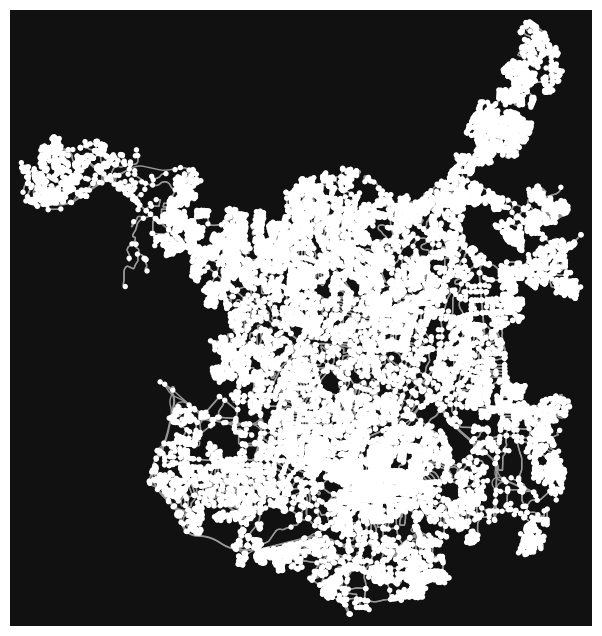

(<Figure size 800x800 with 1 Axes>, <AxesSubplot: >)

In [204]:
## Let's try on a longer travel
G4 = ox.graph_from_place("Raleigh, USA", network_type="drive") 

ox.plot_graph(G4)


In [205]:
node_r , edge_r = ox.graph_to_gdfs(G4)
x = []
for i in edge_r['highway'].values:
    if i not in x:
        x.append(i)
x

['residential',
 'tertiary',
 'primary',
 'secondary',
 'primary_link',
 'motorway_link',
 'motorway',
 'trunk',
 'trunk_link',
 'unclassified',
 'tertiary_link',
 ['residential', 'tertiary'],
 'secondary_link',
 ['residential', 'unclassified'],
 ['residential', 'primary_link']]

In [206]:
G4 = ox.add_edge_speeds(G4, hwy_speeds = speed_dict)
G4 = ox.add_edge_travel_times(G4)

nodes4, edges4 = ox.graph_to_gdfs(G4)

# starting: 35.9158332,-78.4714274 
# ending: 35.7891446,-78.8509757 #h mart
orig_node4 = ox.nearest_nodes(G4, X= -78.4714274, Y = 35.9158332)
dest_node4 = ox.nearest_nodes(G4, X= -78.8509757, Y = 35.7891446)

route_length4 = nx.shortest_path(G4, orig_node4, dest_node4, weight='length')
route_time4 = nx.shortest_path(G4, orig_node4, dest_node4, weight='travel_time') 

In [209]:
orig_node4

1308994181

In [210]:
dest_node4

2553091213

In [213]:
m1 = folium.Map(height=400, width=600)
ox.plot_route_folium(G4, route_length4, route_map=m1, tiles = 'asss', color='#cc0000', weight=5, opacity=0.8)

In [214]:
m1 = folium.Map(height=400, width=600)
ox.plot_route_folium(G4, route_time4, route_map=m1, tiles = 'asss', color='#cc0000', weight=5, opacity=0.8)